In [1]:
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
from stripes.detection import Detector
%matplotlib inline

In [2]:
detector = Detector()

In [3]:
def read_images(path):
    images_names = glob.glob(path + '/' + '*.jpg')
    return [cv2.cvtColor(cv2.imread(image_name), cv2.COLOR_BGR2RGB) for image_name in images_names]

In [4]:
images = read_images("../images/tables")

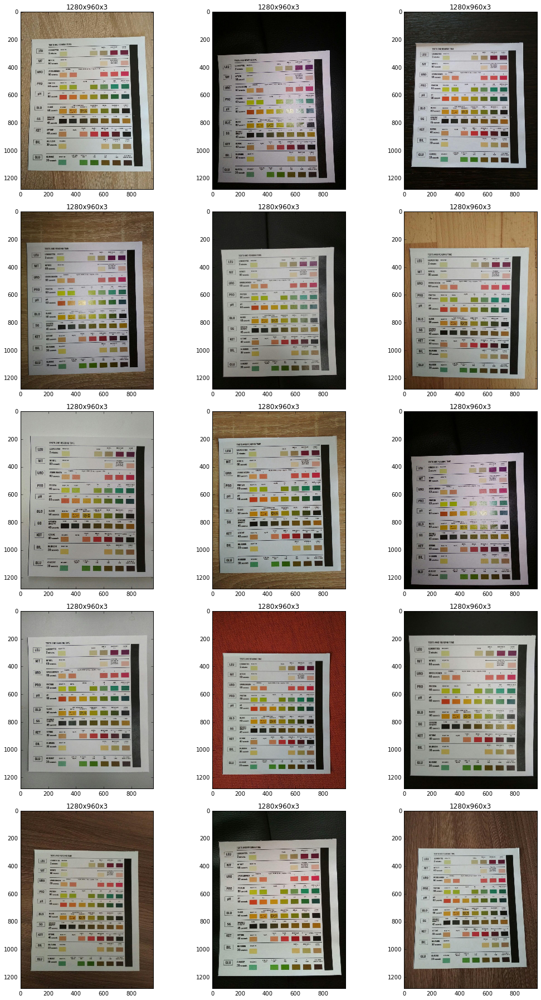

In [28]:
plt.figure(figsize=(15, 25))
for j, image in enumerate(images, 1):
    plt.subplot(5, 3, j)
    plt.title("%dx%dx%d" % image.shape)
    plt.imshow(image)
plt.tight_layout()
plt.show()

Бинаризуем так, чтобы нашлись границы:

In [6]:
def denoise(image, ksize):
    return cv2.medianBlur(image, ksize=ksize)

In [7]:
def binarize(image, blocksize, C):
    if len(image.shape) == 2:
        out = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                       cv2.THRESH_BINARY, blockSize=blocksize, C=C)
    else:
        out = cv2.adaptiveThreshold(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY), 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                       cv2.THRESH_BINARY, blockSize=blocksize, C=C)
    return out

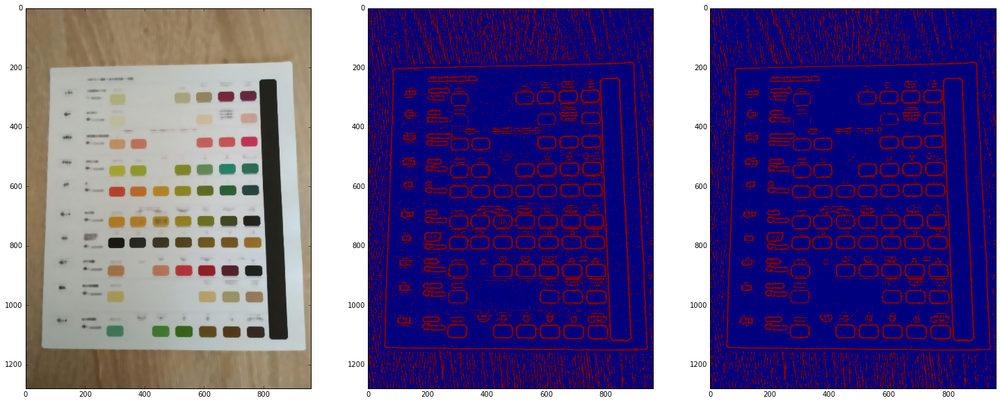

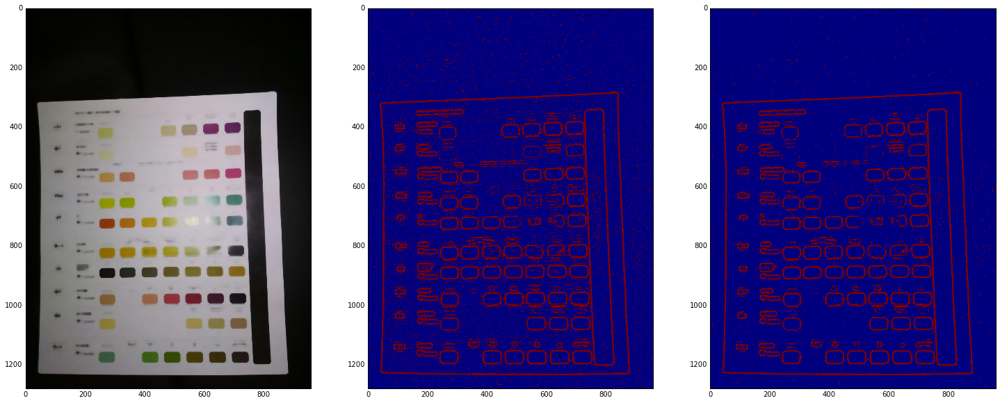

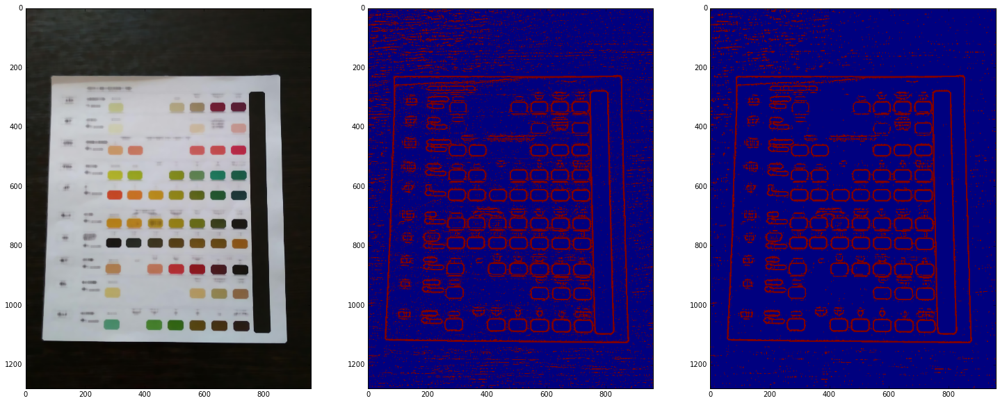

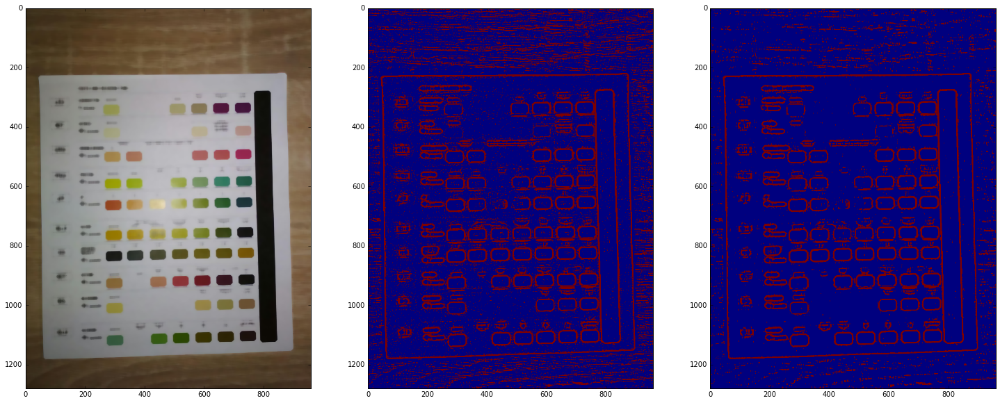

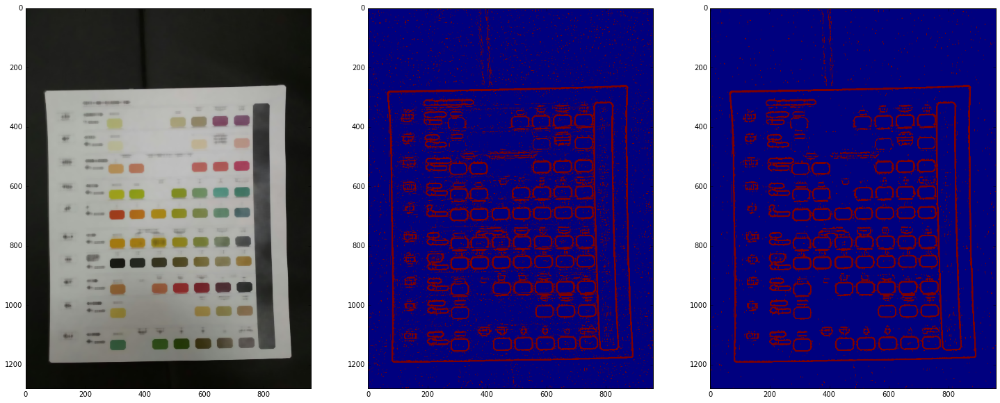

...

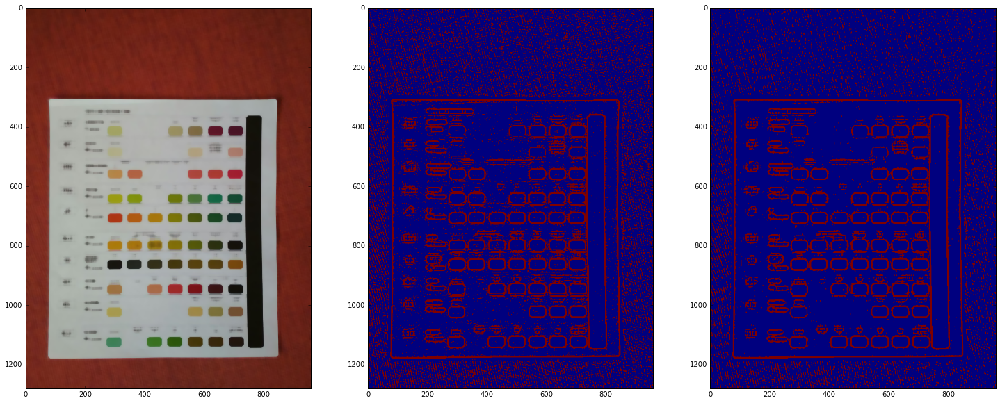

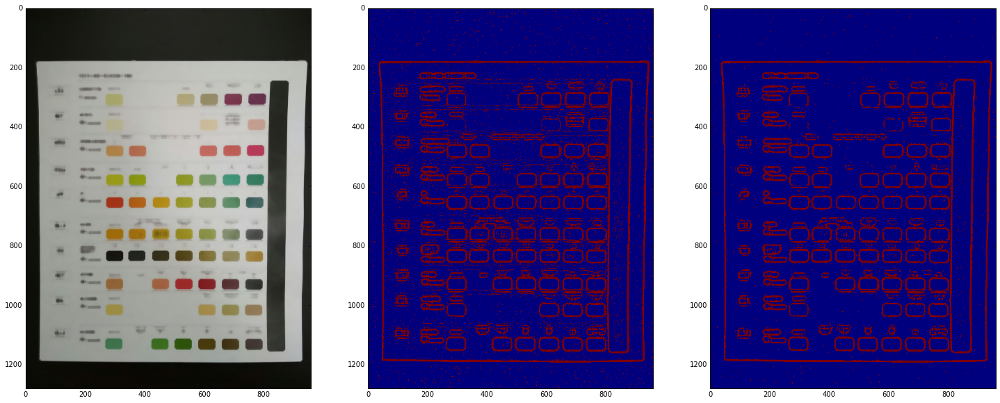

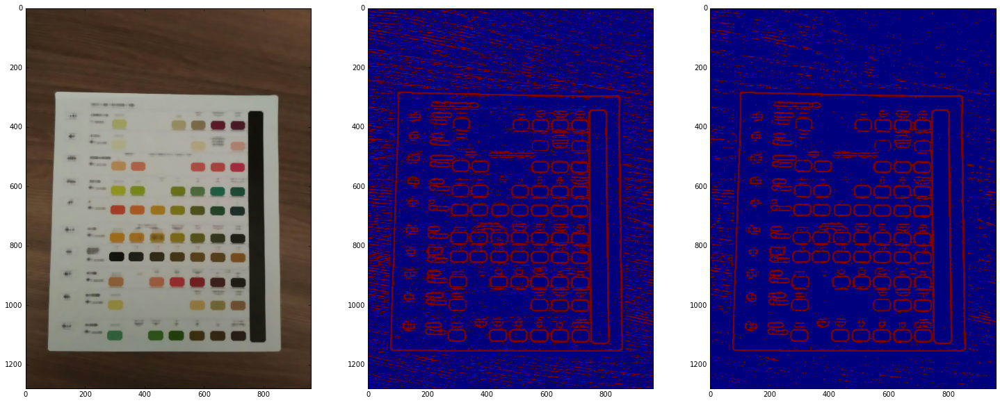

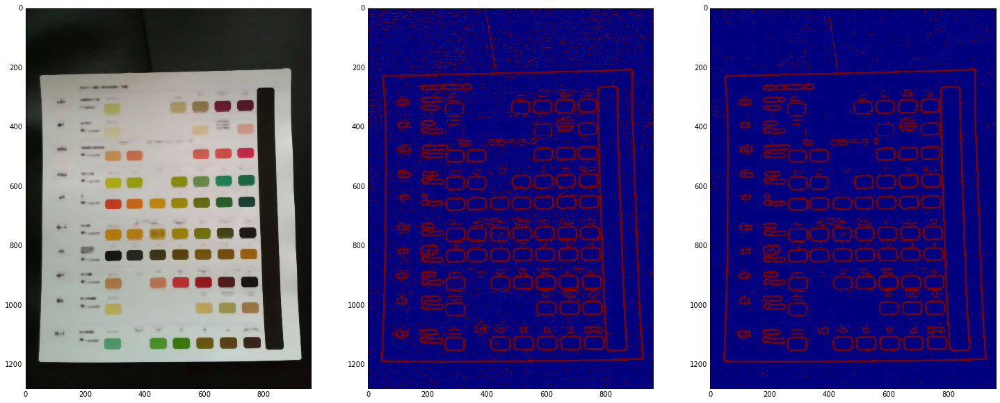

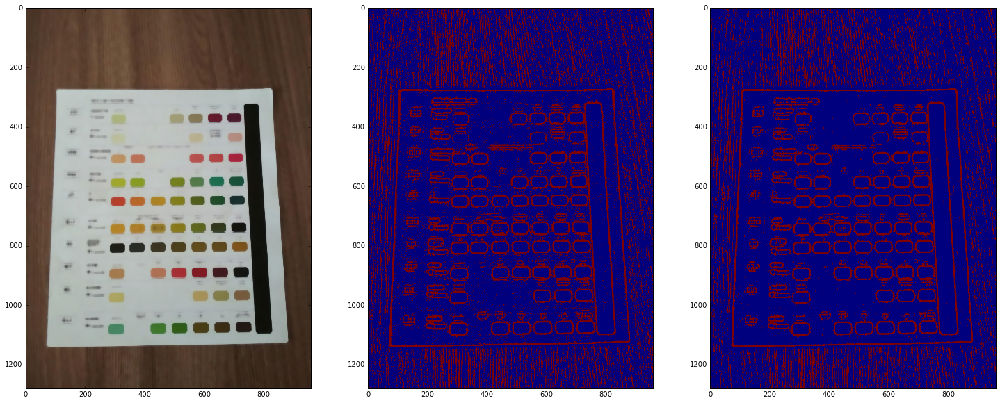

In [8]:
for j, image in enumerate(images, 1):
    plt.figure(figsize=(25, 25))
    plt.subplot(1, 3, 1)
    plt.imshow(denoise(image, ksize=15))
    plt.subplot(1, 3, 2)
    binary = binarize(image=denoise(image, ksize=15), blocksize=11, C=0)
    plt.imshow(binary)
    plt.subplot(1, 3, 3)
    binary_morph = cv2.morphologyEx(binary, cv2.MORPH_OPEN, np.ones(3))
    plt.imshow(binary_morph)
    plt.show()    

Ищем самый большой контур:

In [9]:
def get_max_area_contour_id(contours):
    max_area = 0.
    max_contour_id = -1
    for j, contour in enumerate(contours):
        new_area = cv2.contourArea(contour)
        if new_area >= max_area:
            max_area = new_area
            max_contour_id = j
    return max_contour_id

In [10]:
w_target, h_target = 148 * 5, 166 * 5
print _

In [11]:
def find_corners(image):
#     contour_raveled = np.array([contour[j][0].tolist() for j in xrange(len(contour))])
#     idxs = np.argsort(contour_raveled[:, 0])
    corners = cv2.cornerHarris(image, 10, 3, 0.04)
    return cv2.dilate(corners, None)

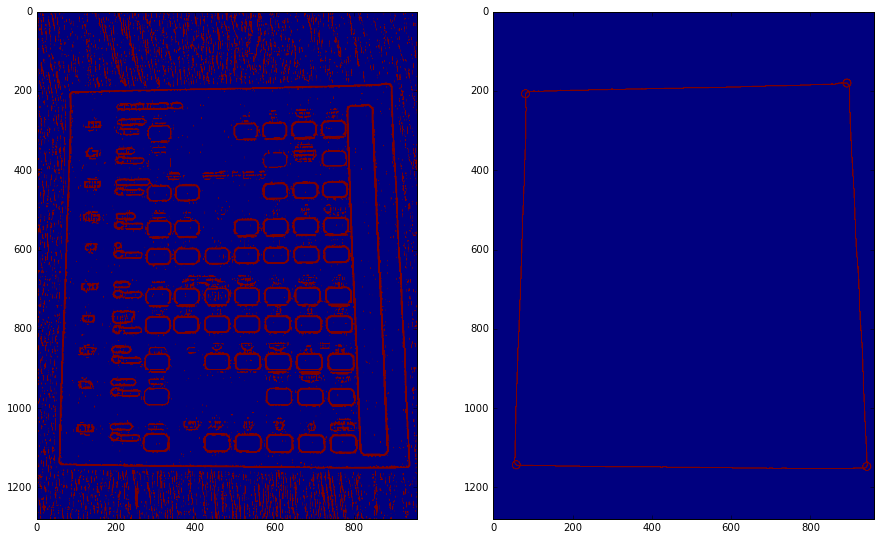

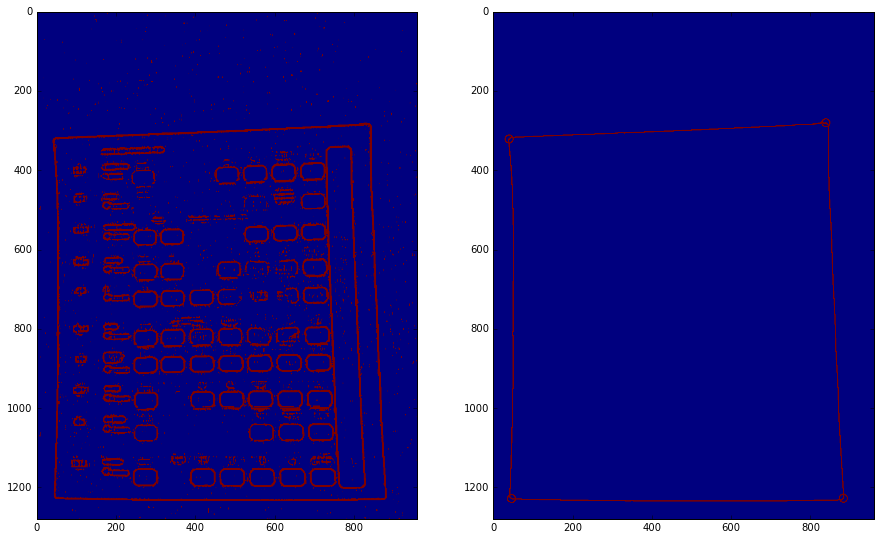

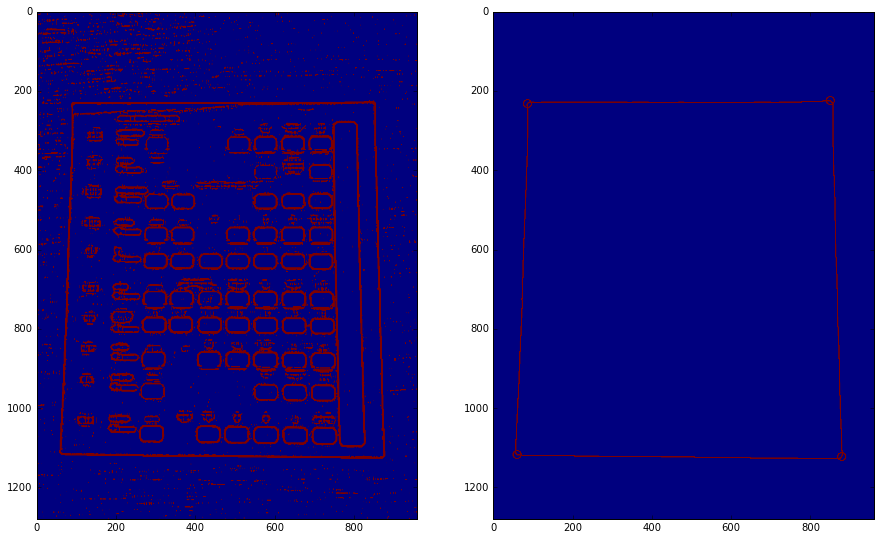

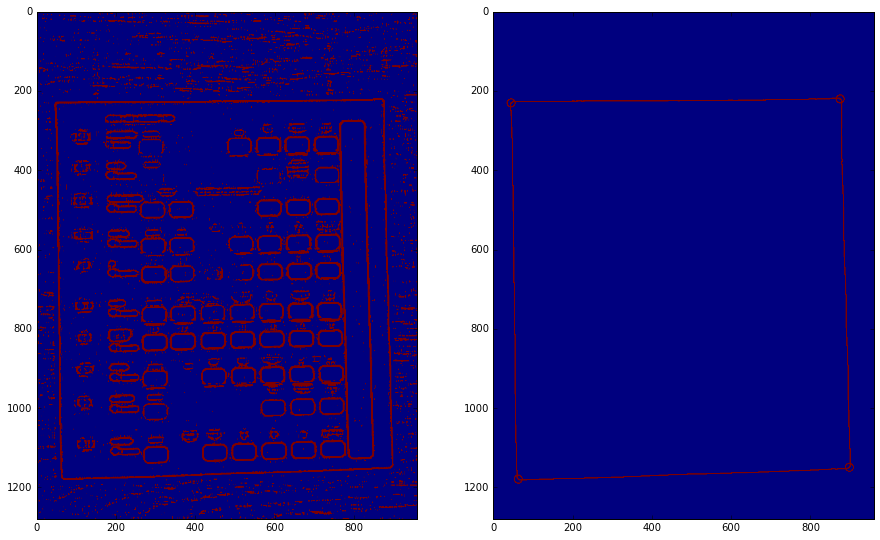

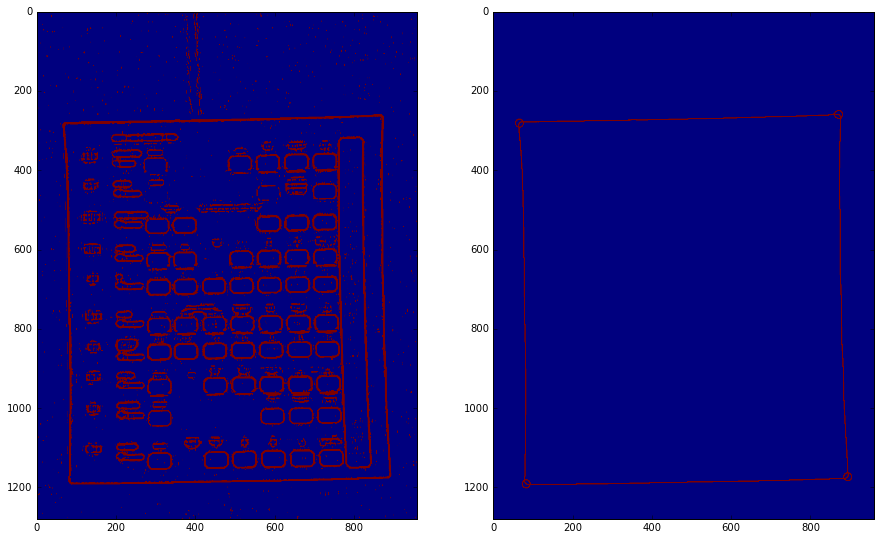

...

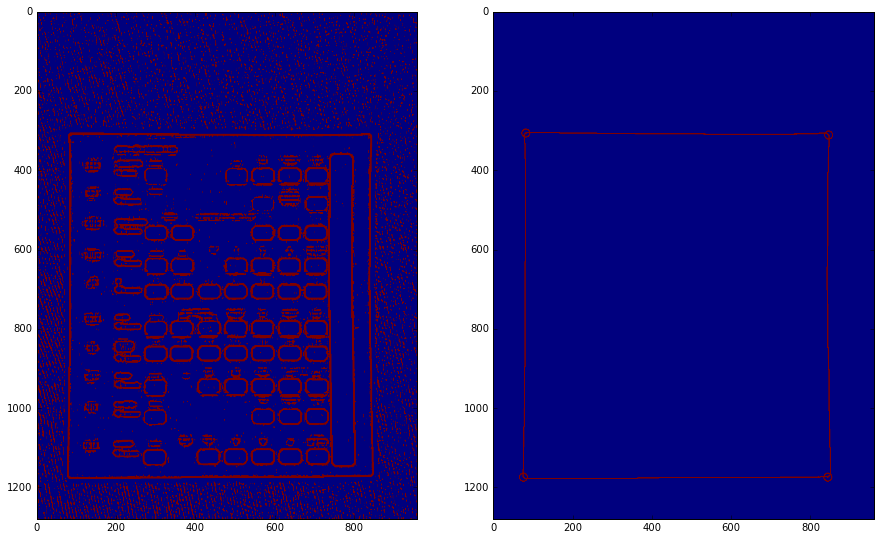

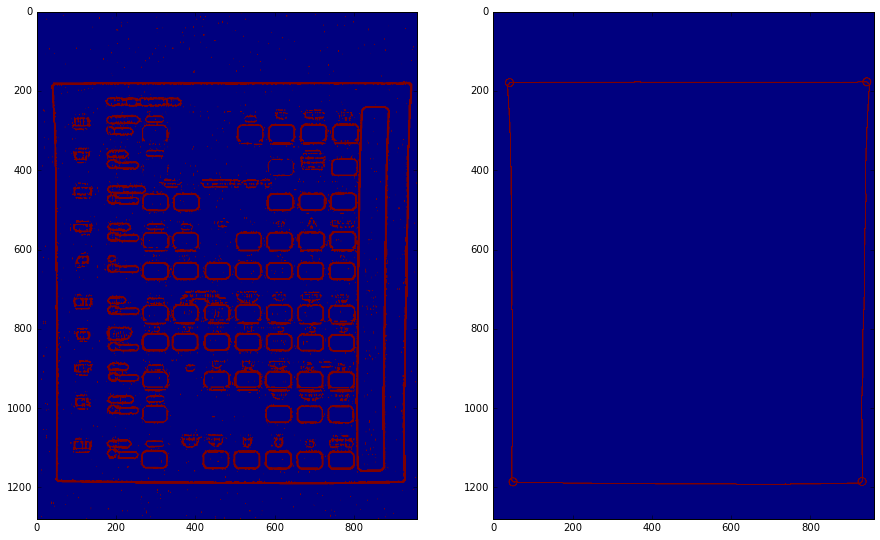

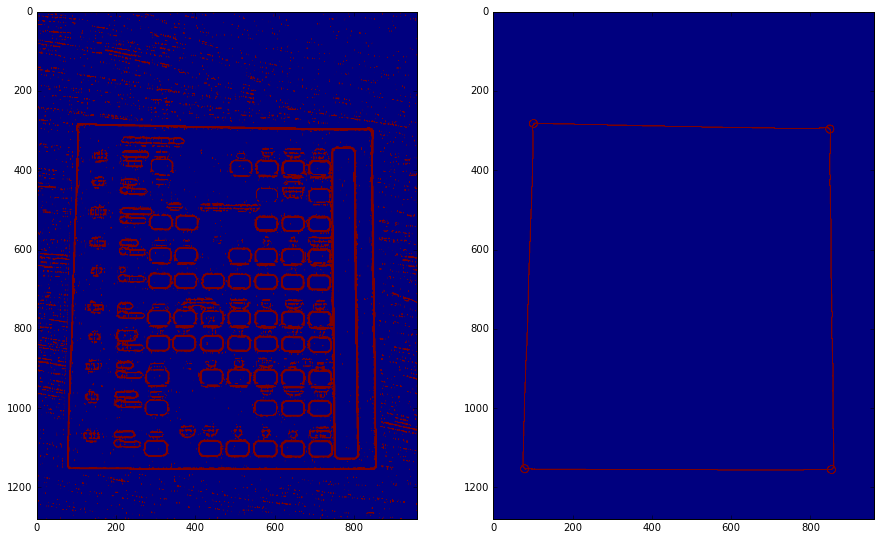

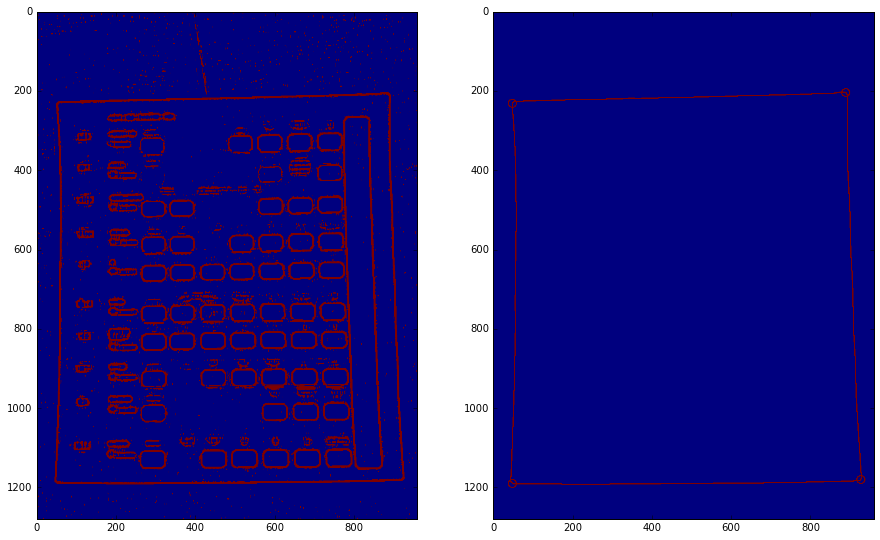

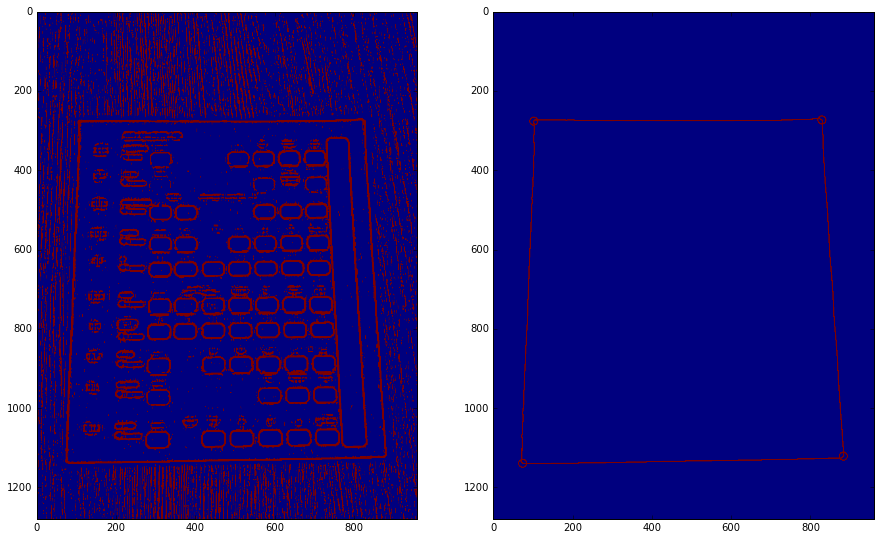

In [25]:
for j, image in enumerate(images, 1):
    
    plt.figure(figsize=(15, 25))
    plt.subplot(1, 2, 1)
    binary = binarize(image=denoise(image, ksize=15), blocksize=11, C=0)
    binary_morph = cv2.morphologyEx(binary, cv2.MORPH_OPEN, np.ones(3))
    plt.imshow(binary_morph)
    
    plt.subplot(1, 2, 2)
    r, contours, h = cv2.findContours(binary_morph, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
#     binary_copy = cv2.cvtColor(binary_morph.copy(), cv2.COLOR_GRAY2RGB)
    binary_copy = binary_morph.copy()
    
    white = np.zeros_like(binary_copy)
#     cv2.drawContours(white, contours, -1, (255, 0, 0), 1)
    maxId = get_max_area_contour_id(contours)
    cv2.drawContours(white, contours, maxId, (255, 255, 255), 2)
    
    poly = cv2.approxPolyDP(contours[maxId], epsilon=0.01*cv2.arcLength(contours[maxId], closed=True), closed=True)
#     cv2.drawContours(white, [poly], 0, (255, 255, 255), 2)
#     print len(poly)
    for vert in poly:
        cv2.circle(white, tuple(vert[0]), 10, (255, 0, 0), 2)
#     hull = cv2.convexHull(contours[maxId])
#     print len(hull)
#     cv2.drawContours(white, [hull], 0, (255, 255, 255), 2)
    
#     corners = find_corners(white)
#     plt.imshow(corners, cmap='gray')
    
    verts = Detector.get_correct_arrangement(np.array())
    
    plt.imshow(white)
    plt.show()
    